In [5]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

import geopandas as gpd
from shapely.geometry import Point

import folium

import statsmodels.api as sm

import warnings
warnings.simplefilter("ignore")

In [8]:
df = pd.read_excel("D:\\Data Science\\Python_lib\\Dataset.xlsx")
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Cuisines,Average Cost for two,Currency,...,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...","French, Japanese, Desserts",1100,Botswana Pula(P),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",Japanese,1200,Botswana Pula(P),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...","Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...","Japanese, Sushi",1500,Botswana Pula(P),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...","Japanese, Korean",1500,Botswana Pula(P),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df.isnull().sum()

Restaurant ID         0
Restaurant Name       0
Country Code          0
City                  0
Address               0
                   ... 
Unnamed: 80        9551
Unnamed: 81        9551
Unnamed: 82        9551
Unnamed: 83        9551
Unnamed: 84        9550
Length: 85, dtype: int64

In [10]:
df.describe()

,Restaurant ID,Country Code,Average Cost for two,Longitude,Latitude,Aggregate rating,Price range,Votes,Unnamed: 22,Unnamed: 23,...,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,9.051128e+06,18.365616,1199.210763,64.126574,25.854381,2.666370,1.804837,156.909748,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,8.791521e+06,56.750546,16121.183073,41.467058,11.007935,1.516378,0.905609,430.169145,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,5.300000e+01,1.000000,0.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,3.019625e+05,1.000000,250.000000,77.081343,28.478713,2.500000,1.000000,5.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,6.004089e+06,1.000000,400.000000,77.191964,28.570469,3.200000,2.000000,31.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,1.835229e+07,1.000000,700.000000,77.282006,28.642758,3.700000,2.000000,131.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,1.850065e+07,216.000000,800000.000000,174.832089,55.976980,4.900000,4.000000,10934.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 85 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Cuisines              9551 non-null   object 
 8   Average Cost for two  9551 non-null   int64  
 9   Currency              9551 non-null   object 
 10  Has Table booking     9551 non-null   object 
 11  Has Online delivery   9551 non-null   object 
 12  Is delivering now     9551 non-null   object 
 13  Switch to order menu  9551 non-null   object 
 14  Rating color          9551 non-null   object 
 15  Rating text          

1.Find cuisines with consistently higher ratings

In [12]:
cuisine_high_rating = df.groupby('Cuisines')['Aggregate rating'].mean().reset_index()

sort_cuisine  = cuisine_high_rating.sort_values(by='Aggregate rating',ascending=False)

print(sort_cuisine)

                              Cuisines  Aggregate rating
13             American, BBQ, Sandwich               4.9
1215   Mexican, American, Healthy Food               4.9
1287                 Mughlai, Lucknowi               4.9
37        American, Caribbean, Seafood               4.9
1063                     Italian, Deli               4.9
...                                ...               ...
463                Cafe, North Eastern               0.0
160                           Assamese               0.0
1650                         Raw Meats               0.0
1654  Raw Meats, North Indian, Chinese               0.0
166               Awadhi, North Indian               0.0

[1827 rows x 2 columns]


## Level 1

## Task 2: Descriptive Analysis

1.Calculate basic statistical measures for numerical columns	mean mediam mode for all numerical columns


In [13]:
int_column = df.select_dtypes(include=['int64'])

int_column1= int_column.drop(columns=['Restaurant ID', 'Country Code'] )   

mean_value = int_column1.mean()
median_value = int_column1.median()
mode_value = int_column1.mode().iloc[0]

print("Mean:-\n",mean_value)
print("\nMedian:-\n",median_value)
print("\nMode:-",mode_value)

Mean:-
 Average Cost for two    1199.210763
Price range                1.804837
Votes                    156.909748
dtype: float64

Median:-
 Average Cost for two    400.0
Price range               2.0
Votes                    31.0
dtype: float64

Mode:- Average Cost for two    500
Price range               1
Votes                     0
Name: 0, dtype: int64


2.Explore distribution of categorical variables (Country Code, City, Cuisines)	charts for categorical column  

In [14]:
df3 = df[['Country Code', 'City', 'Cuisines']].head()
df3 

,Country Code,City,Cuisines
0,162,Makati City,"French, Japanese, Desserts"
1,162,Makati City,Japanese
2,162,Mandaluyong City,"Seafood, Asian, Filipino, Indian"
3,162,Mandaluyong City,"Japanese, Sushi"
4,162,Mandaluyong City,"Japanese, Korean"


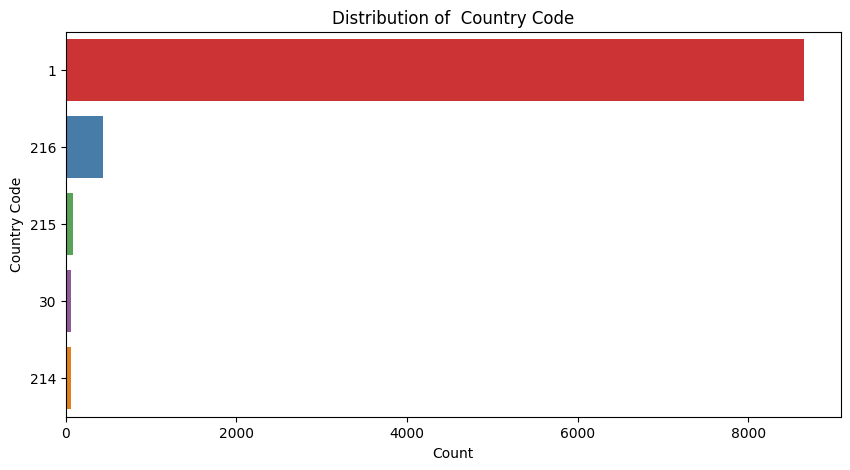

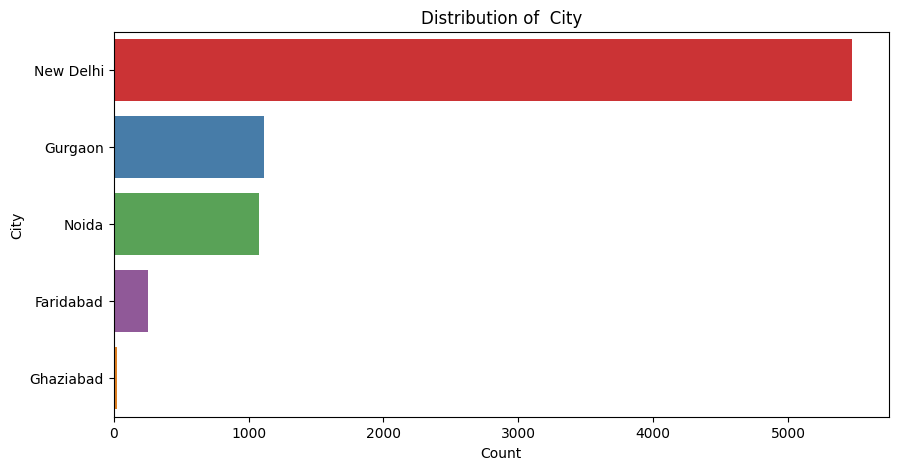

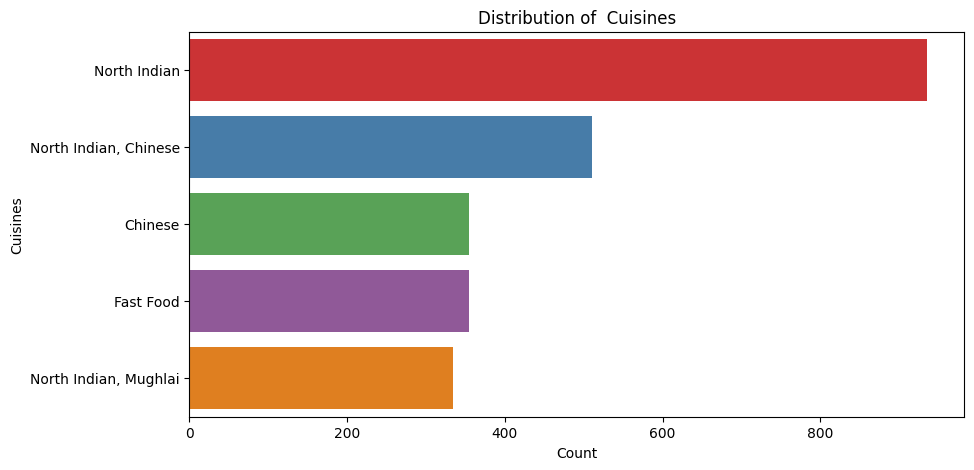

In [16]:


def plot_categorical_distribution(column):
    plt.figure(figsize=(10,5))
    sns.countplot(y=df[column], order=df[column].value_counts().head(5).index ,palette='Set1')
    plt.title(f"Distribution of  {column}")
    plt.xlabel("Count")
    plt.ylabel(column)
    
    plt.show()

categorical_columns = df3[['Country Code', 'City', 'Cuisines']] 
for col in categorical_columns:
    plot_categorical_distribution(col)




3.Identify top cuisines and cities with highest restaurant counts

In [17]:
Top_cities = df.groupby('City')['Restaurant Name'].count().reset_index()
top_cities=  Top_cities.sort_values(by='Restaurant Name', ascending= False ).head(10)
                                                                     
Top_Cuisines = df.groupby('Cuisines')['Restaurant Name'].count().reset_index()
top_Cuisines=  Top_Cuisines.sort_values(by='Restaurant Name', ascending= False ).head(10)


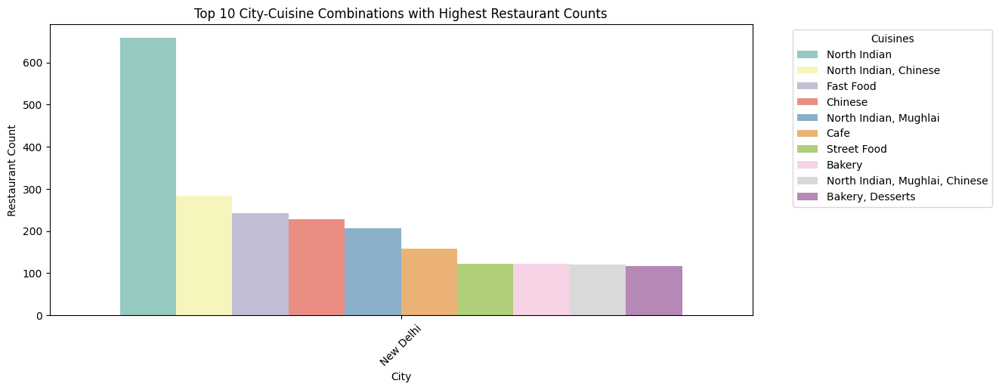

In [18]:
Top_cities_Cuisines = df.groupby(['Cuisines','City'])['Restaurant Name'].count().reset_index()
Top_cities_Cuisines = Top_cities_Cuisines.sort_values(by='Restaurant Name', ascending= False ).head(10)
Top_cities_Cuisines

plt.figure(figsize=(12,5))
sns.barplot(x='City', y='Restaurant Name', hue='Cuisines', data=Top_cities_Cuisines, palette='Set3')
plt.title('Top 10 City-Cuisine Combinations with Highest Restaurant Counts')
plt.xlabel('City')
plt.ylabel('Restaurant Count')
plt.xticks(rotation=45)
plt.legend(title="Cuisines", bbox_to_anchor=(1.05, 1), loc='upper left')


In [19]:
df['City'].value_counts()

City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64

## Task 3: Geospatial Analysis

1.Visualize restaurant locations using latitude/longitude Use some 3rd party library like - shapely & geopandas

In [20]:
import folium

In [21]:

map_center = [df['Latitude'].mean(),df['Longitude'].mean()]
resto_map = folium.Map(Location = map_center, zoom_start=5)

for index,row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'],row['Longitude']],
        popup=f"{row['Restaurant Name']}",
        icon=folium.Icon(color="red", icon="cutlery", prefix="fa")  
    ).add_to(resto_map)

resto_map.save("resto_map.html")
resto_map


In [22]:
import geopandas as gpd
from shapely.geometry import Point

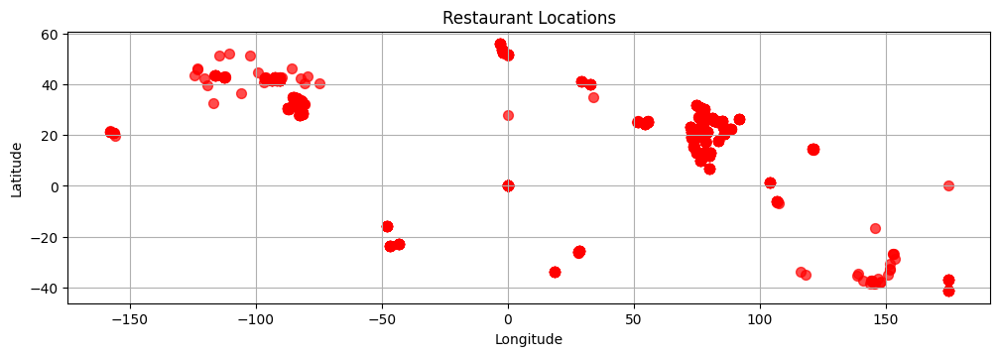

In [23]:
df4 = df[['Restaurant Name','Latitude','Longitude']]

df4['Coordinates'] = df4.apply(lambda row: Point(row['Longitude'], row['Latitude'] ),axis=1)
gdf = gpd.GeoDataFrame(df4, geometry='Coordinates', crs="EPSG:4326")

fig, ax = plt.subplots(figsize=(12, 8))
gdf.plot(ax=ax, color='red', markersize=50, alpha=0.7)
plt.title("Restaurant Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()



 2.Analyze restaurant distribution across cities/countries charts

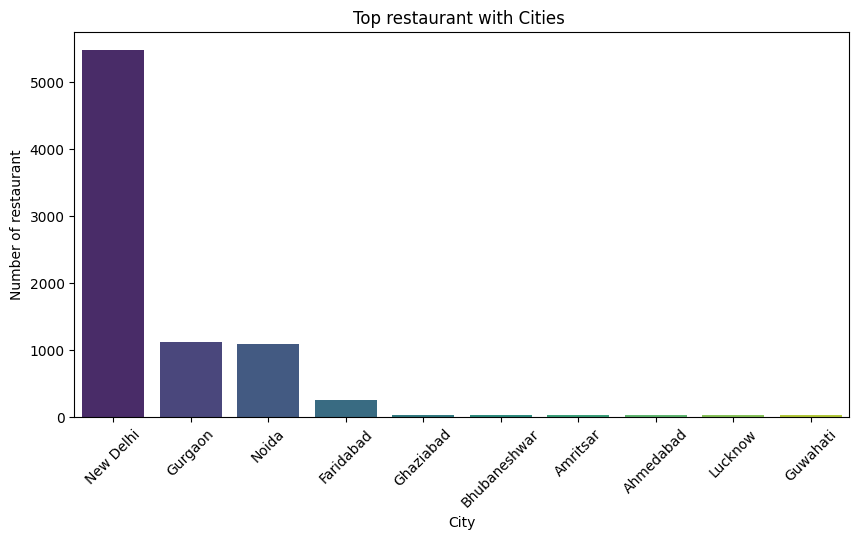

In [24]:
city_counts = df['City'].value_counts().head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=city_counts.index, y=city_counts.values, palette='viridis' )
plt.title('Top restaurant with Cities ')
plt.xlabel('City')
plt.ylabel('Number of restaurant')
plt.xticks(rotation=45)
# plt.legend()

plt.show()

In [25]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Cuisines', 'Average Cost for two',
       'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Longitude', 'Latitude', 'Aggregate rating',
       'Price range', 'Votes', 'Rating Bin ', 'Unnamed: 22', 'Unnamed: 23',
       'Unnamed: 24', 'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27',
       'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31',
       'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35',
       'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39',
       'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43',
       'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47',
       'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51',
       'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55',
       'Unnamed: 56', 'Unnamed: 57', 

In [26]:
df['Country Code'].unique()

array([162,  30, 216,  14,  37, 184, 214,   1,  94, 148, 215, 166, 189,
       191, 208], dtype=int64)

3.Find correlations between location and ratings

In [27]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Cuisines', 'Average Cost for two',
       'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Longitude', 'Latitude', 'Aggregate rating',
       'Price range', 'Votes', 'Rating Bin ', 'Unnamed: 22', 'Unnamed: 23',
       'Unnamed: 24', 'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27',
       'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31',
       'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35',
       'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39',
       'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43',
       'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47',
       'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51',
       'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55',
       'Unnamed: 56', 'Unnamed: 57', 

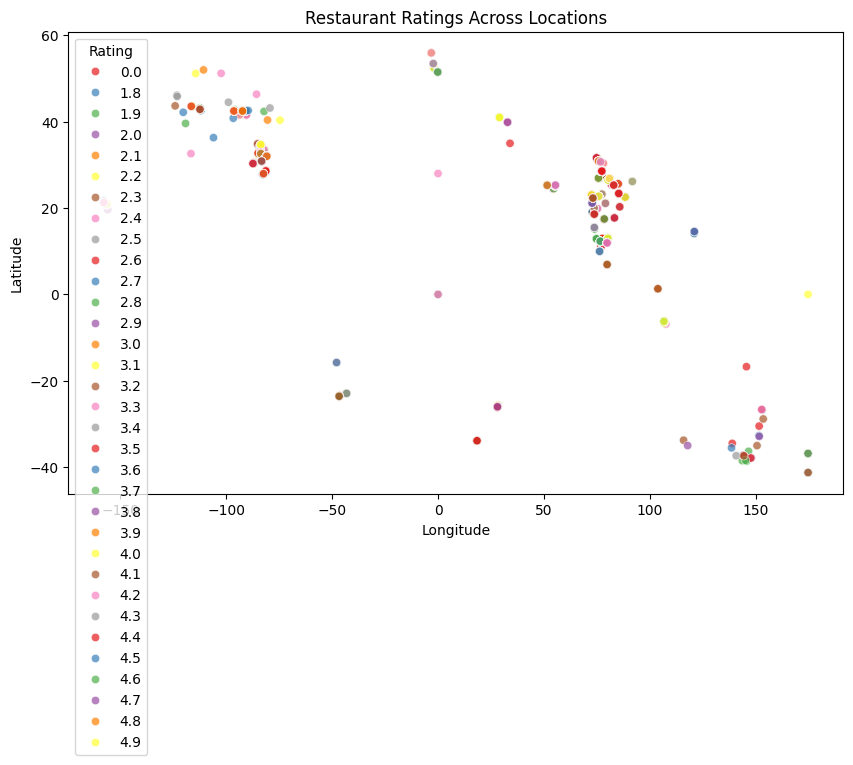

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='Longitude', y='Latitude' ,hue='Aggregate rating', palette='Set1', alpha=0.7) #
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Restaurant Ratings Across Locations")
plt.legend(title="Rating")
plt.show()


In [29]:
corr_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
corr_matrix

,Latitude,Longitude,Aggregate rating
Latitude,1.000000,0.043207,0.000516
Longitude,0.043207,1.000000,-0.116818
Aggregate rating,0.000516,-0.116818,1.000000


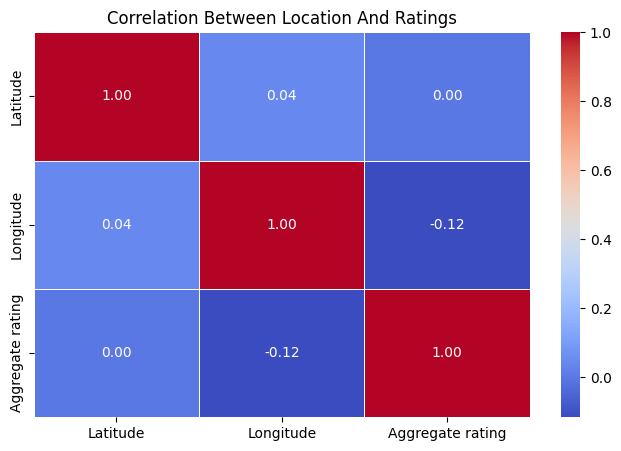

In [30]:
corr_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()

plt.figure(figsize=(8,5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt=".2f",linewidths=0.6)
plt.title('Correlation Between Location And Ratings')
plt.show()

1. Latitude	Longitude	~0.00 to ±0.10	No strong relation (independent)
2. Latitude	Aggregate Rating	Low/Medium (+/- 0.1 to 0.3)	Weak correlation (ratings not strongly dependent on latitude)
3. Longitude	Aggregate Rating	Low/Medium (+/- 0.1 to 0.3)	Weak correlation (ratings slightly influenced by longitude)

LEVEL 2

Task 1: Table Booking and Online Delivery

1.Calculate percentage of restaurants offering these services

In [31]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Cuisines', 'Average Cost for two',
       'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Longitude', 'Latitude', 'Aggregate rating',
       'Price range', 'Votes', 'Rating Bin ', 'Unnamed: 22', 'Unnamed: 23',
       'Unnamed: 24', 'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27',
       'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31',
       'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35',
       'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39',
       'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43',
       'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47',
       'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51',
       'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55',
       'Unnamed: 56', 'Unnamed: 57', 

Has Table booking      12.124385
Has Online delivery    25.662234
Is delivering now       0.355984
dtype: float64


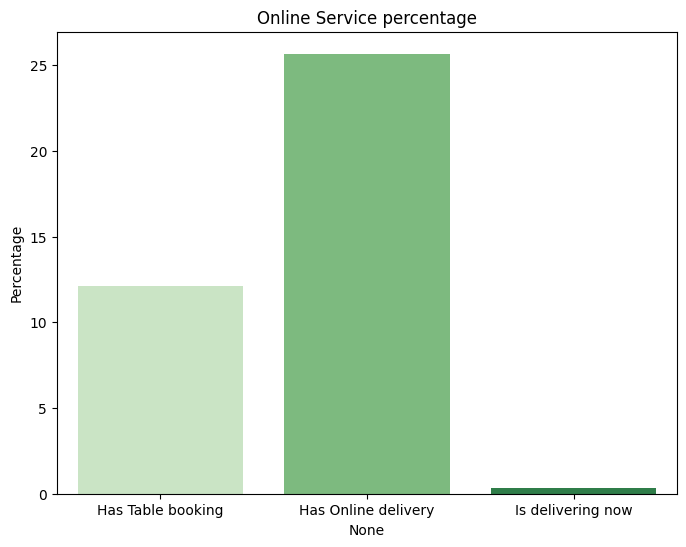

In [32]:
service_columns = ['Has Table booking','Has Online delivery', 'Is delivering now']

df[service_columns] = df[service_columns].replace({"Yes": 1, "No": 0})

service_percentage = (df[service_columns].sum()/len(df))*100


print(service_percentage )

plt.figure(figsize=(8,6))
sns.barplot(x=service_percentage.index,y=service_percentage.values,palette='Greens')
plt.title('Online Service percentage')
plt.ylabel('Percentage')
plt.show()

2.Compare ratings between restaurants with/without table booking

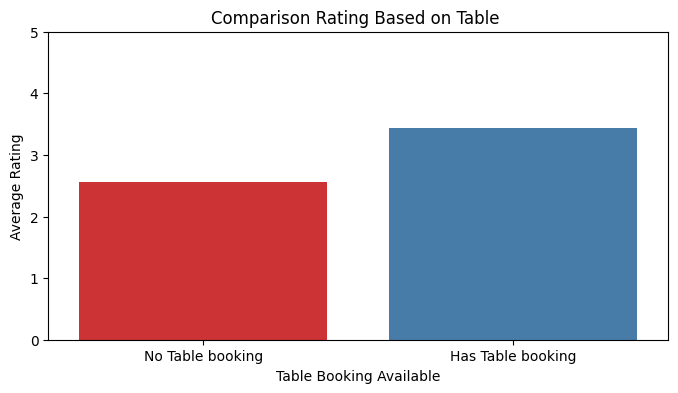

Has Table booking
0    2.559359
1    3.441969
Name: Aggregate rating, dtype: float64


In [33]:
df['Has Table booking'] = df['Has Table booking'].replace({"Yes": 1, "No": 0})

compare_rating = df.groupby('Has Table booking')['Aggregate rating'].mean()

plt.figure(figsize=(8,4))
sns.barplot(x=compare_rating.index, y=compare_rating.values,palette='Set1')
plt.xlabel('Table Booking Available')
plt.ylabel('Average Rating')
plt.title('Comparison Rating Based on Table ')
plt.xticks(ticks=[1,0],labels=['Has Table booking','No Table booking'])
plt.ylim(0,5)
plt.show()

print(compare_rating)

3.Analyze online delivery availability across price ranges

In [34]:
df['Has Table booking'] = df['Has Table booking'].replace({"Yes": 1, "No": 0})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 85 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Cuisines              9551 non-null   object 
 8   Average Cost for two  9551 non-null   int64  
 9   Currency              9551 non-null   object 
 10  Has Table booking     9551 non-null   int64  
 11  Has Online delivery   9551 non-null   int64  
 12  Is delivering now     9551 non-null   int64  
 13  Switch to order menu  9551 non-null   object 
 14  Rating color          9551 non-null   object 
 15  Rating text          

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


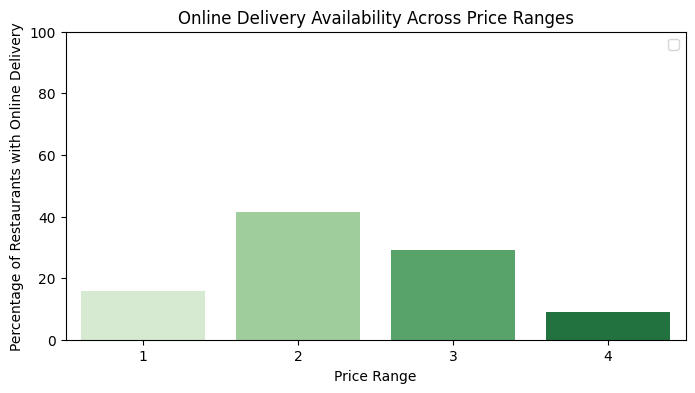

Price range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
Name: Has Online delivery, dtype: float64


In [35]:
df['Has Table booking'] = df['Has Table booking'].replace({"Yes": 1, "No": 0})

online_delivery_percentage = df.groupby('Price range')['Has Online delivery'].mean() * 100

plt.figure(figsize=(8,4))
sns.barplot(x=online_delivery_percentage.index, y=online_delivery_percentage.values,palette='Greens')
 
plt.xlabel("Price Range")
plt.ylabel("Percentage of Restaurants with Online Delivery")
plt.title("Online Delivery Availability Across Price Ranges")
plt.xticks(rotation=0)
plt.ylim(0, 100)
plt.legend()

plt.show()

print(online_delivery_percentage )

## Task 2: Price Range Analysis

1.Identify most common price range

In [36]:
common_prcie_range = df['Price range'].value_counts()
common_prcie_range

Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [37]:
most_common_price_range = common_prcie_range.idxmax()
count = most_common_price_range.max()

print(f"The most common price range is {most_common_price_range}, with {count} restaurants.")

The most common price range is 1, with 1 restaurants.


2.Calculate average rating per price range

In [38]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Cuisines', 'Average Cost for two',
       'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Longitude', 'Latitude', 'Aggregate rating',
       'Price range', 'Votes', 'Rating Bin ', 'Unnamed: 22', 'Unnamed: 23',
       'Unnamed: 24', 'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27',
       'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31',
       'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35',
       'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39',
       'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43',
       'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47',
       'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51',
       'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55',
       'Unnamed: 56', 'Unnamed: 57', 

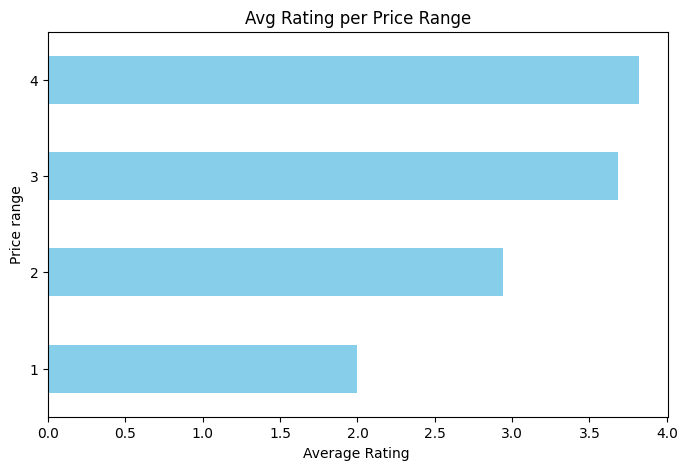

Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


In [39]:
avg_rating_per_price_range = df.groupby('Price range')['Aggregate rating'].mean()
avg_rating_per_price_range

plt.figure(figsize=(8,5))
avg_rating_per_price_range.plot(kind='barh', color='skyblue')
plt.title('Avg Rating per Price Range')
plt.ylabel('Price range')
plt.xlabel('Average Rating ')
plt.show()

print(avg_rating_per_price_range)

3.Find color representing highest average rating among price ranges

In [40]:
avr_rating_price = df.groupby('Price range')['Aggregate rating'].mean()
highest_avg_rating = avr_rating_price.idxmax() 

color_high_rating = df[df['Price range']== highest_avg_rating]['Rating color'].mode()[0]

print(f"Price range with highest average rating: {highest_avg_rating}")
print(f"Color representing the highest average rating: {color_high_rating}")

Price range with highest average rating: 4
Color representing the highest average rating: Yellow


## Task 3: Feature Engineering

1.Extract new features from existing columns Split Cuisines into separate columns


In [41]:
split_cuisine = df['Cuisines'].str.split(',',expand=True)

split_cuisine.columns = [f'Cuisines_{i+1}' for i in range(split_cuisine.shape[1])]

df = pd.concat([df, split_cuisine], axis=1)
df= pd.concat([df,split_cuisine],axis=1)
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Cuisines,Average Cost for two,Currency,...,Cuisines_7,Cuisines_8,Cuisines_1,Cuisines_2,Cuisines_3,Cuisines_4,Cuisines_5,Cuisines_6,Cuisines_7,Cuisines_8
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...","French, Japanese, Desserts",1100,Botswana Pula(P),...,None,None,French,Japanese,Desserts,None,None,None,None,None
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",Japanese,1200,Botswana Pula(P),...,None,None,Japanese,None,None,None,None,None,None,None
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...","Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),...,None,None,Seafood,Asian,Filipino,Indian,None,None,None,None
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...","Japanese, Sushi",1500,Botswana Pula(P),...,None,None,Japanese,Sushi,None,None,None,None,None,None
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...","Japanese, Korean",1500,Botswana Pula(P),...,None,None,Japanese,Korean,None,None,None,None,None,None


2.Create binary features for table booking and online delivery


In [8]:
df['Has Table booking'] = df['Has Table booking'].replace({"Yes": 1, "No": 0})
df['Has Online delivery'] = df['Has Online delivery'].replace({"Yes": 1, "No": 0})
df['Is delivering now'] = df['Is delivering now'].replace({"Yes": 1, "No": 0})

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   int64  
 13  Has Online delivery   9551 non-null   int64  
 14  Is delivering now     9551 non-null   int64  
 15  Switch to order menu 

3.Encode categorical variables
 one hot
 

## Level 3.Predictive Modeling

1.Build regression model for restaurant rating prediction.

2.Split data into training/testing sets

3.Compare performance of different algorithms (linear regression, decision trees, random forest)
